In [209]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from skimage.exposure import match_histograms
from enum import Enum
from typing import Any, List
from utils import *
from PIL import Image, ImageDraw, ImageFont

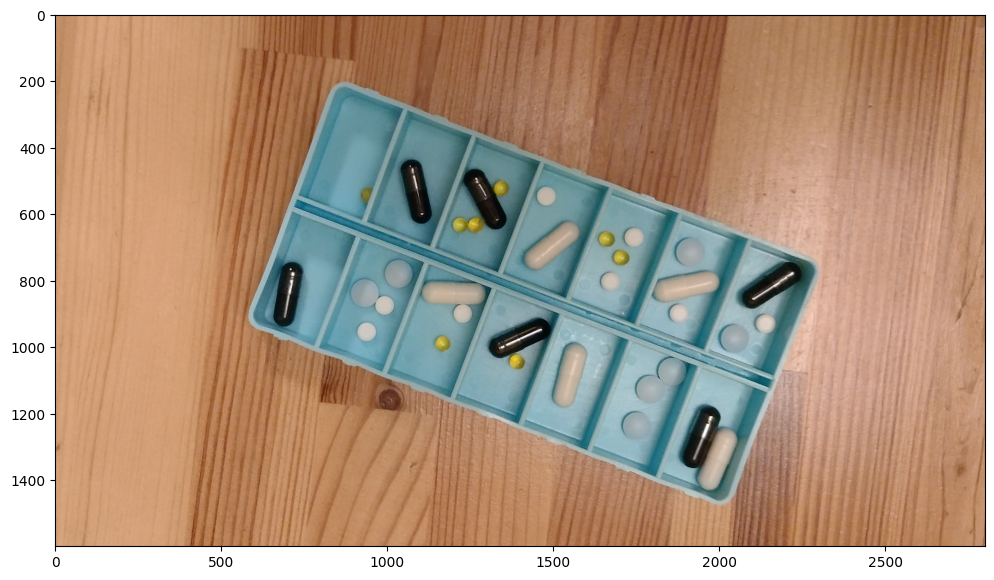

In [210]:
test = cv2.imread('test.png')
test_hsv = cv2.cvtColor(test, cv2.COLOR_BGR2HSV)
test_lab = cv2.cvtColor(test, cv2.COLOR_BGR2LAB)
test_gray = cv2.cvtColor(test, cv2.COLOR_BGR2GRAY)
plt.subplots(1, 1, figsize=(12,8))[1].imshow(test[..., ::-1]);

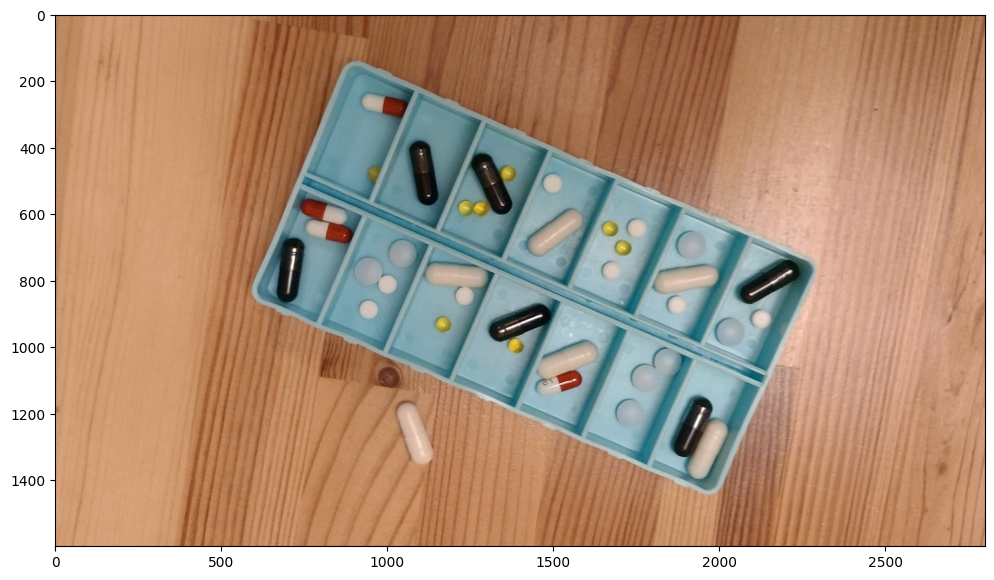

In [211]:
test_line = cv2.imread('test_line.png')
test_line_hsv = cv2.cvtColor(test_line, cv2.COLOR_BGR2HSV)
test_line_lab = cv2.cvtColor(test_line, cv2.COLOR_BGR2LAB)
test_line_gray = cv2.cvtColor(test_line, cv2.COLOR_BGR2GRAY)
plt.subplots(1, 1, figsize=(12,8))[1].imshow(test_line[..., ::-1]);

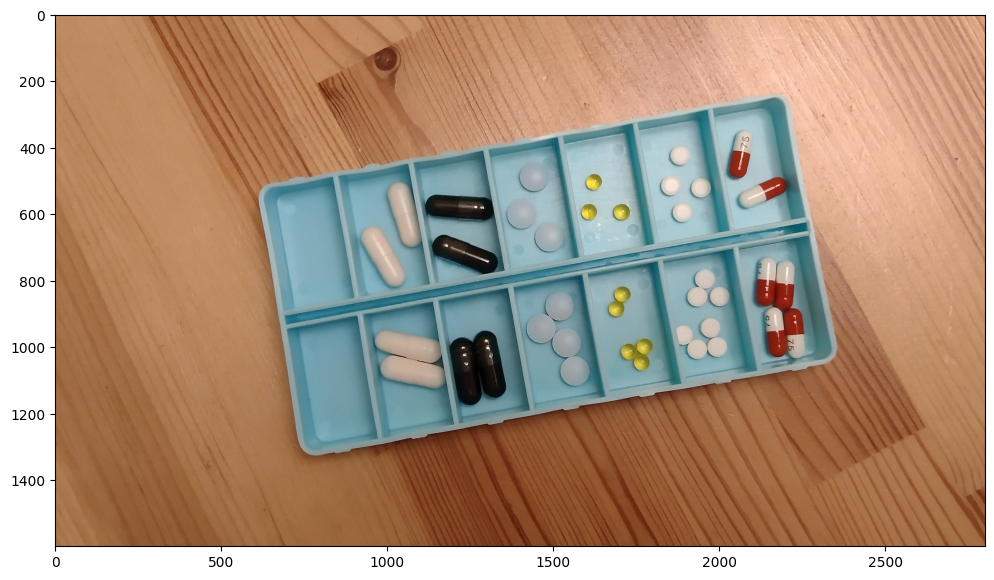

In [212]:
calib = cv2.imread('calib.png')
calib_hsv = cv2.cvtColor(calib, cv2.COLOR_BGR2HSV)
calib_lab = cv2.cvtColor(calib, cv2.COLOR_BGR2LAB)
calib_gray = cv2.cvtColor(calib, cv2.COLOR_BGR2GRAY)
plt.subplots(1, 1, figsize=(12,8))[1].imshow(calib[..., ::-1]);

In [213]:
# analyze_channels(calib, calib_lab, calib_hsv)

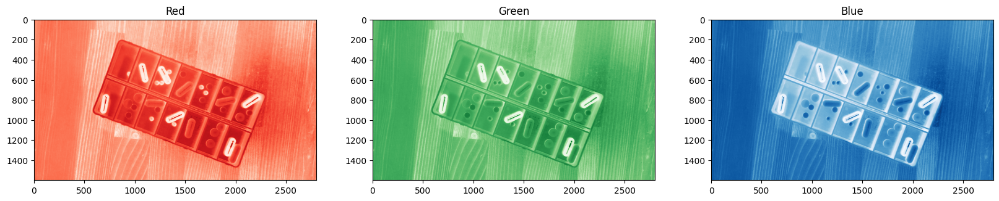

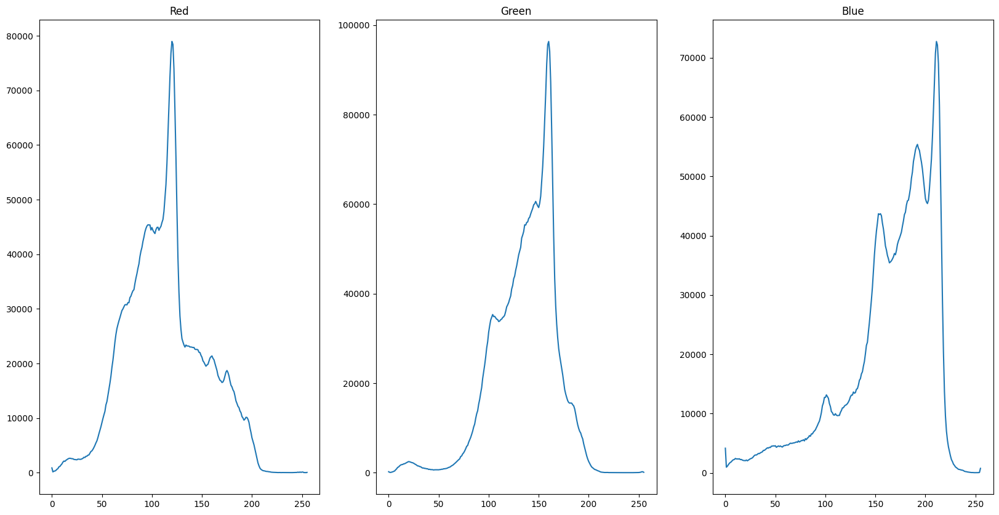

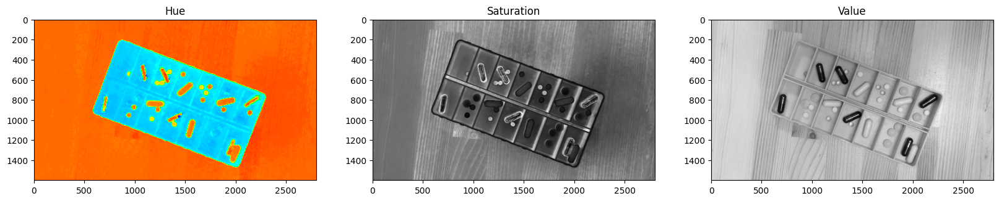

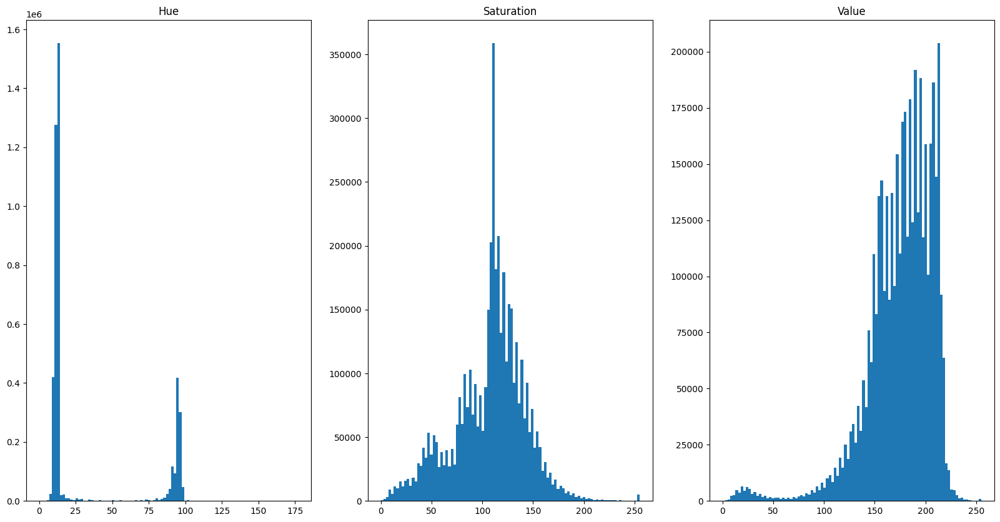

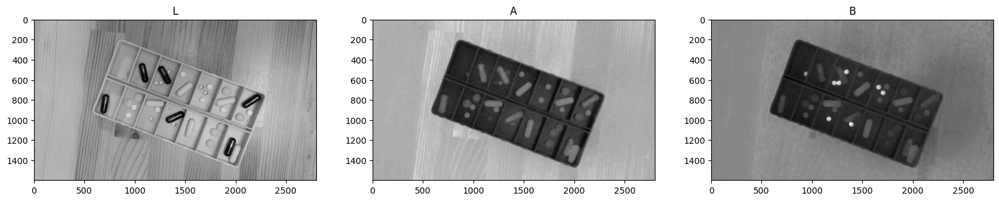

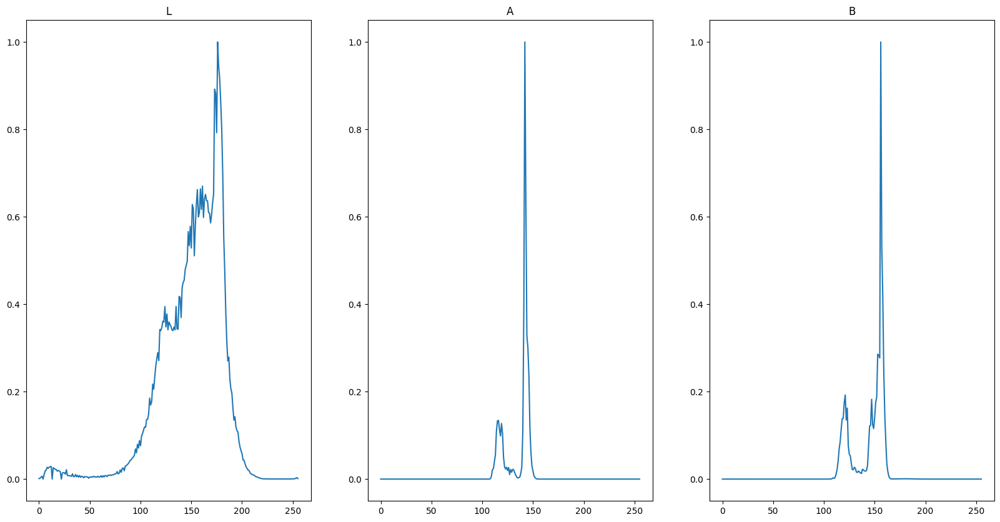

In [214]:
analyze_channels(test, test_lab, test_hsv)

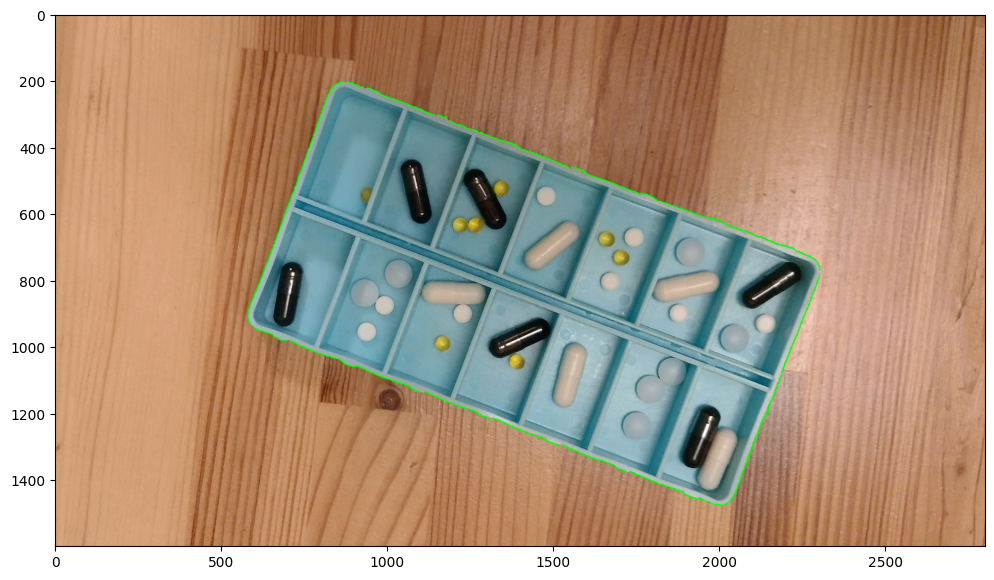

In [274]:
l, a, b = cv2.split(test_lab)
gray = a
ret, thresh = cv2.threshold(gray, 135, 255, cv2.THRESH_BINARY_INV)
box, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# draw contours
img_rgb = cv2.cvtColor(test_lab, cv2.COLOR_LAB2RGB)
img = cv2.drawContours(img_rgb.copy(), box[0], -1, (0, 255, 0), 3)
plt.subplots(1, 1, figsize=(12,8))[1].imshow(img)
plt.show()

In [273]:
box
# analyze_channels(test_line, test_line_lab, test_line_hsv)

(array([[[866, 203]],
 
        [[865, 204]],
 
        [[861, 204]],
 
        ...,
 
        [[869, 204]],
 
        [[868, 203]],
 
        [[867, 204]]], dtype=int32),
 array([[[1969, 1303]],
 
        [[1970, 1302]],
 
        [[1971, 1303]],
 
        [[1970, 1304]]], dtype=int32),
 array([[[2143, 1195]],
 
        [[2144, 1194]],
 
        [[2145, 1195]],
 
        [[2144, 1196]]], dtype=int32),
 array([[[1273,  498]],
 
        [[1274,  497]],
 
        [[1275,  498]],
 
        [[1274,  499]]], dtype=int32))

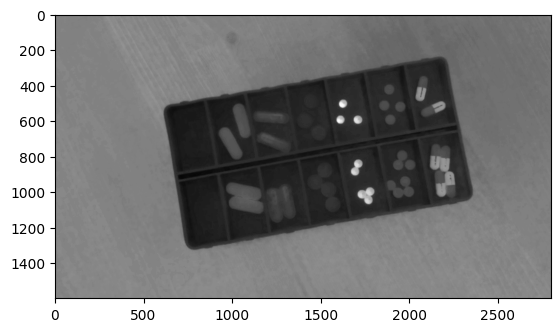

In [216]:
L, A, B = cv2.split(calib_lab)
gray = B
plt.imshow(gray, cmap='gray')
plt.show()

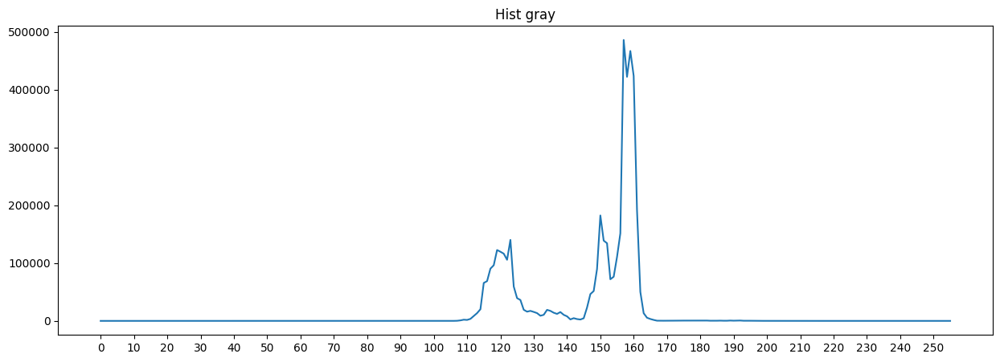

In [217]:
hist_gray_plot(gray)

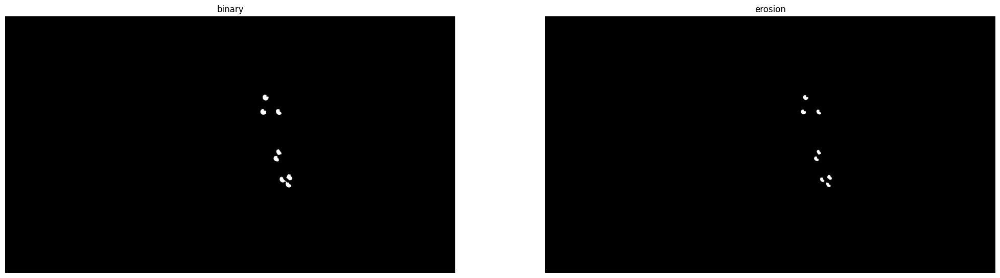

In [218]:
# binaryzacja globalna
ret, thresh = cv2.threshold(gray, 180, 255, cv2.THRESH_BINARY)
# erozja
kernel = np.ones((5, 5), np.uint8)
erosion = cv2.erode(thresh, kernel, iterations=1)
display_images([thresh, erosion], ['binary', 'erosion'], 1)


In [277]:
def detect_biox(img_lab, morph = True, kernel_size=3, iterations=1, thresh_val=180):
    l, a, b = cv2.split(test_lab)
    gray = a
    ret, thresh = cv2.threshold(gray, 135, 255, cv2.THRESH_BINARY_INV)
    box, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    ret, thresh = cv2.threshold(b, thresh_val, 255, cv2.THRESH_BINARY)
    
    if morph:
        kernel = np.ones((kernel_size, kernel_size), np.uint8)
        # thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=iterations)
        thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=iterations)
    post = cv2.erode(thresh, kernel, iterations=1)
    contours, hierarchy = cv2.findContours(post, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    pills = [c for c in contours if cv2.contourArea(c) > 90]
    '''# pills = [c for c in pills if cv2.pointPolygonTest(box[0], tuple(c[0][0]), False) == 1]
    x_box, y_box, w_box, h_box = cv2.boundingRect(box[0])
    # Filtruj kontury, sprawdzając, czy ich środek znajduje się w prostokącie otaczającym box[0]
    pills = [c for c in pills if x_box < cv2.moments(c)["m10"] / cv2.moments(c)["m00"] < x_box + w_box and
             y_box < cv2.moments(c)["m01"] / cv2.moments(c)["m00"] < y_box + h_box]'''
    
    img_rgb = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)
    img = cv2.drawContours(img_rgb.copy(), pills, -1, (0, 255, 0), 3)
    # draw x_box, y_box, w_box, h_box
    pills.append(box[0])
    
    for c in pills:
        x, y, w, h = cv2.boundingRect(c)
        cv2.rectangle(img_rgb, (x, y), (x+w, y+h), (0, 255, 0), 2)
    plt.subplots(1, 1, figsize=(12,8))[1].imshow(img_rgb)   
    plt.show()

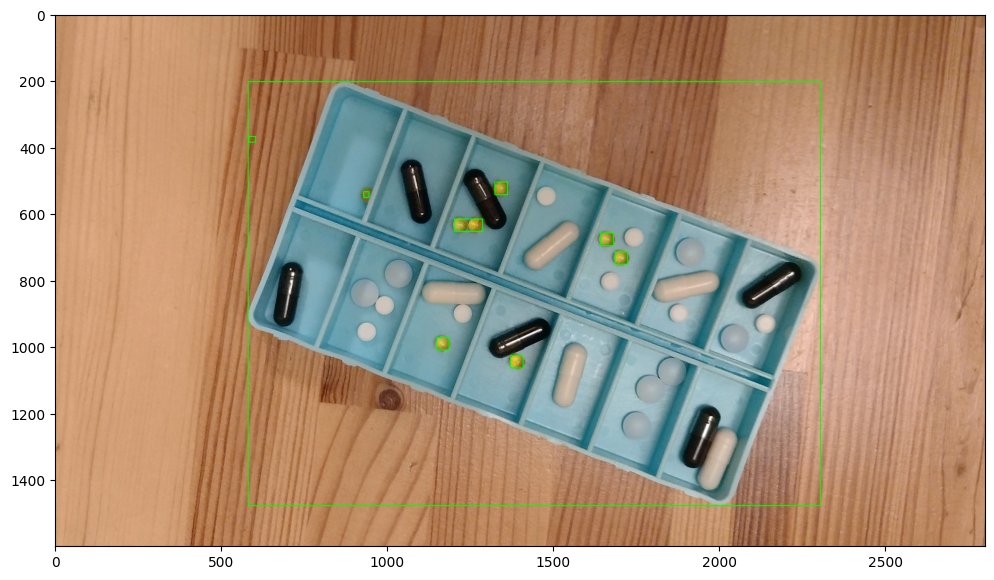

In [279]:
morpho_types = [cv2.MORPH_OPEN, cv2.MORPH_CLOSE, cv2.MORPH_GRADIENT, cv2.MORPH_TOPHAT, cv2.MORPH_BLACKHAT]
for t in morpho_types:
    detect_biox(test_lab, morph=True, kernel_size=3, iterations=8, thresh_val=160)
    break

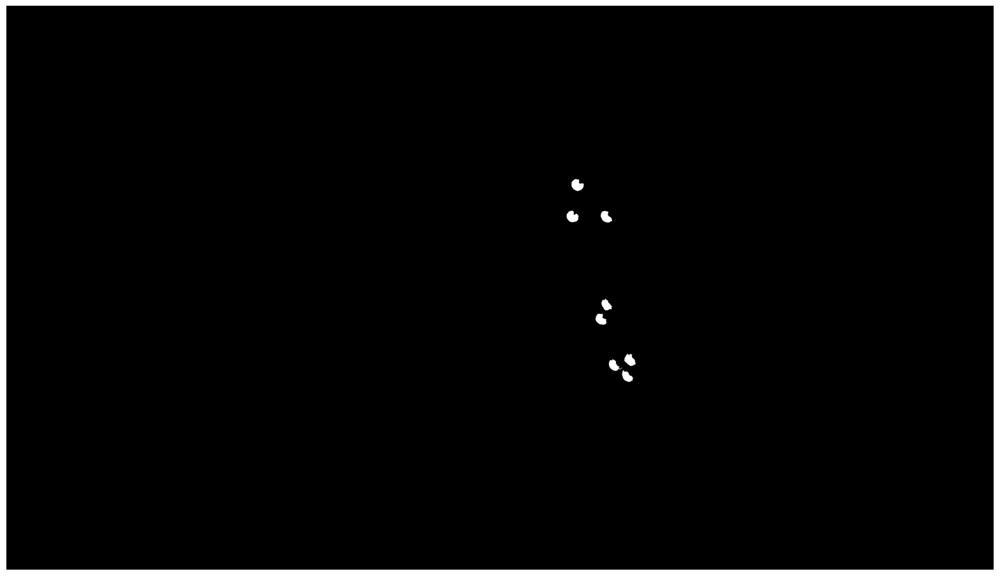

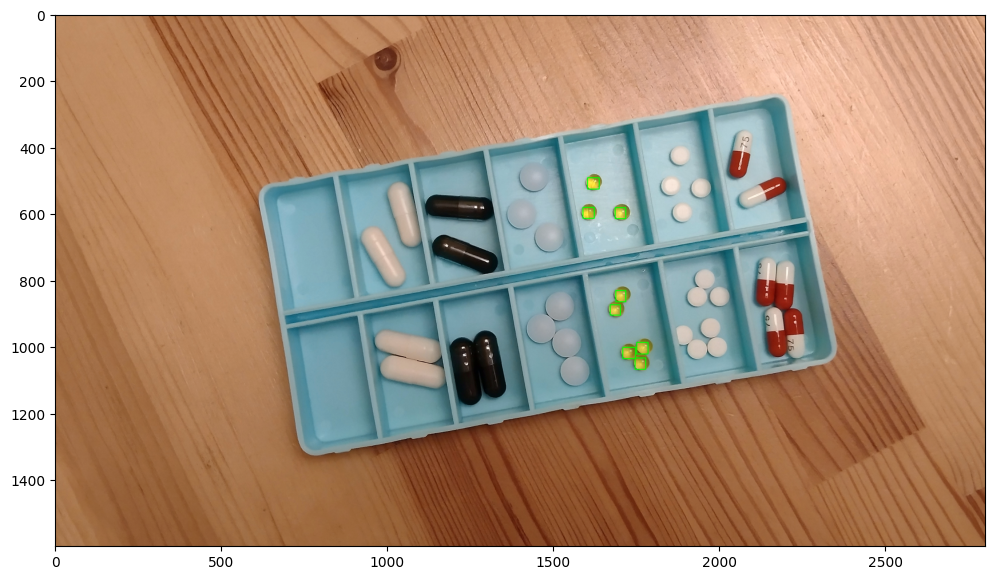

In [221]:

detect_biox(calib_lab, kernel_size=3, iterations=1, thresh=180)

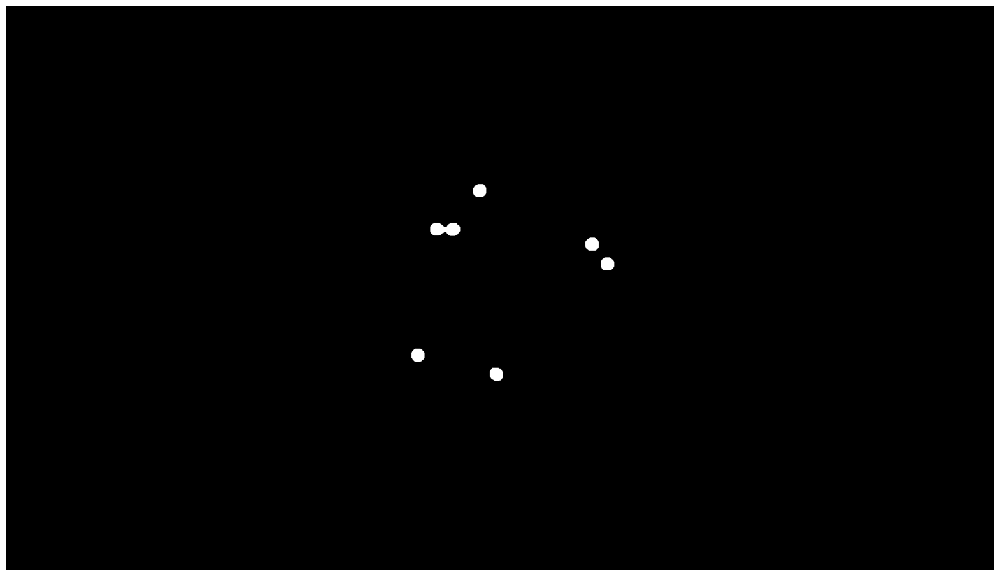

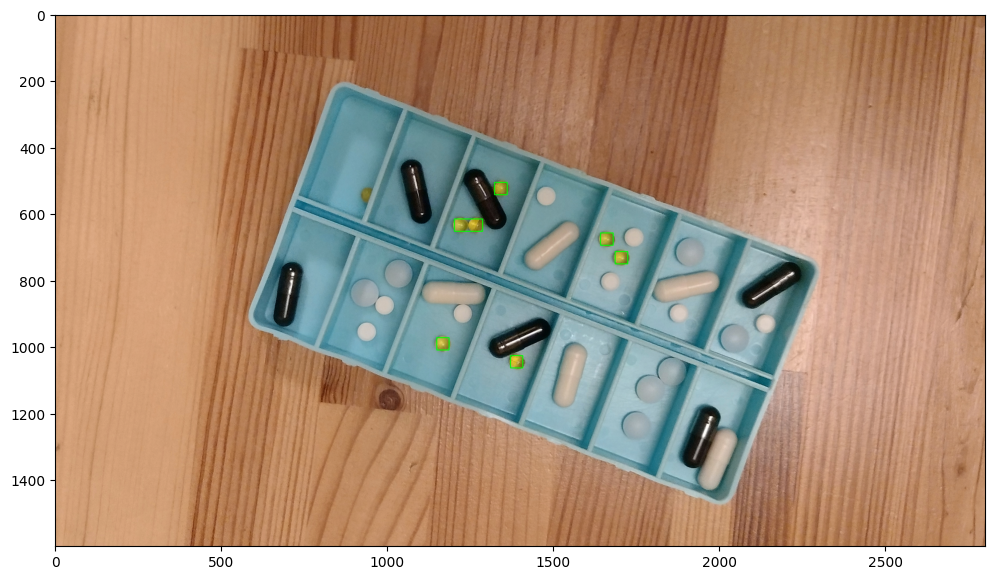

In [232]:
detect_biox(test_lab, kernel_size=3, iterations=7, thresh=164)

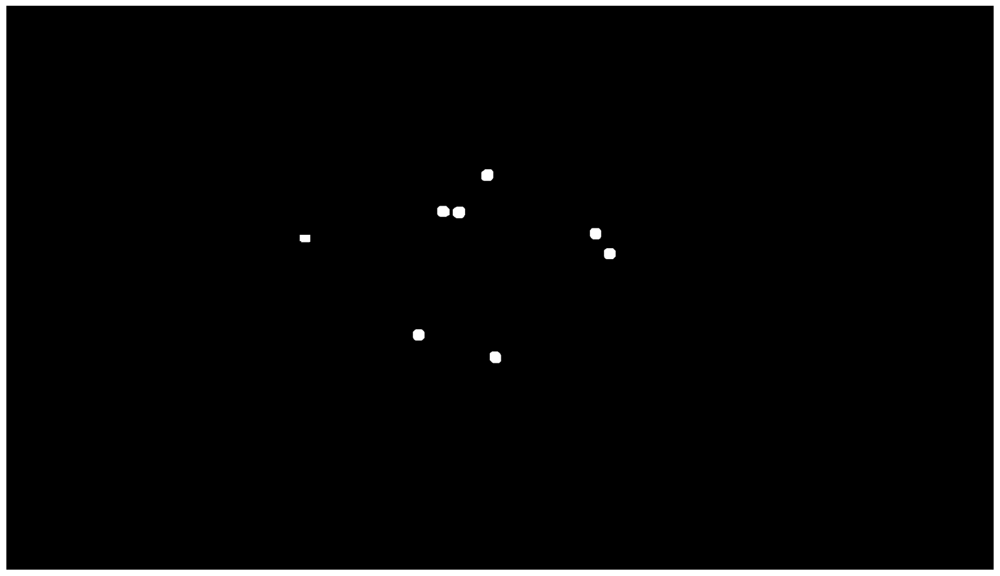

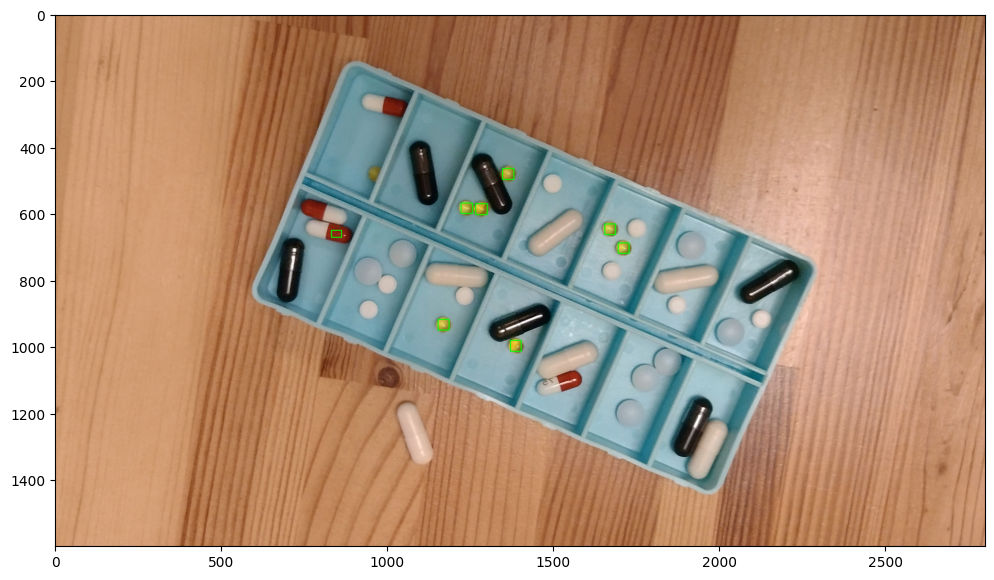

In [223]:
detect_biox(test_line_lab, kernel_size=5, iterations=5, thresh=162)

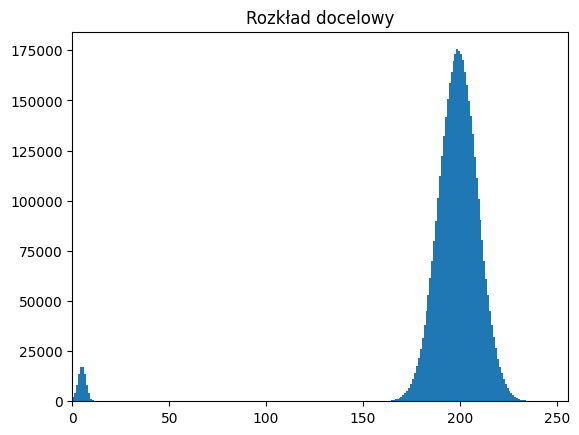

In [224]:
target_distribution = build_bimodal(calib_gray.ravel().shape[0], 5, 200, 2, 10, 0.02)
target_distribution = target_distribution.astype(np.uint8)

plt.hist(target_distribution, bins=256)
plt.xlim([0, 256])
plt.title("Rozkład docelowy")
plt.show()

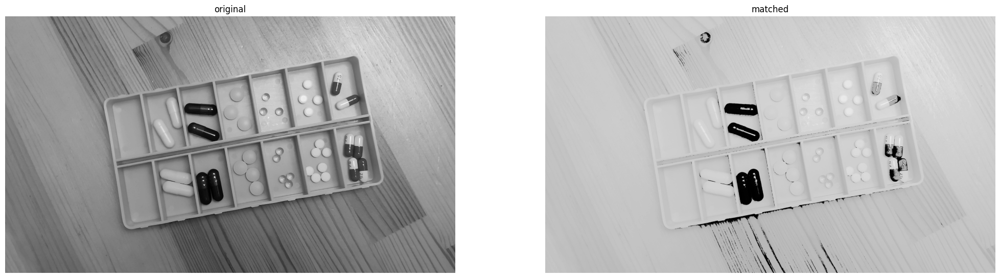

In [225]:
matched = match_histograms(calib_gray.ravel(), target_distribution)
matched = matched.reshape(calib_gray.shape)
matched = matched.astype(np.uint8)
display_images([calib_gray, matched], ['original', 'matched'], 1)

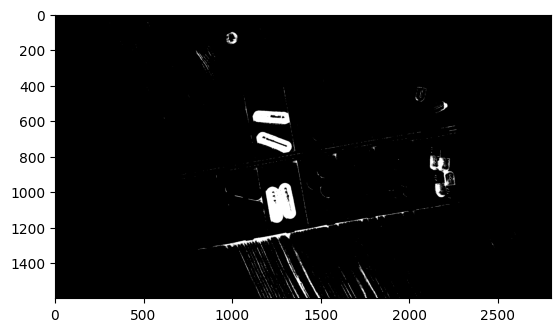

In [226]:
# binaryzacja globalna
ret, thresh = cv2.threshold(matched, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plt.imshow(thresh, cmap='gray')
plt.show()